### Ex1.1: Load and Clean PET, CT sinogram

- CT scanner is parallel beam (i.e. X-ray source is a line parallel to the detector).
- We can use radon and iradon from skimag. 
- It has been acquired around 180 degrees, one measurement per degree  



- PET sinogram has been minimally processed. 
- The listmode data has been made into a singoram, singles/random events and the background noise have been corrected, they are NOT present in the singorams. 
- It has been binned to 180 degrees, on 100 different angles.


Data Flow and Dimensions
All operations maintain consistent array dimensions:
- CT sinogram operations: (512, 180)
- PET sinogram operations: (128, 100)

**CT Sinogram (Transmission) Cleaning**
The CT sinogram is cleaned using **dark-field and flat-field correction** to remove detector bias and normalize variations in illumination. The correction formula follows:

$$ I_{\text{cleaned}} = \frac{I_{\text{raw}} - I_{\text{dark}}}{I_{\text{flat}} - I_{\text{dark}}}$$

where:
- $ I_{\text{raw}} $ is the measured raw CT sinogram.
- $ I_{\text{dark}} $ is the dark-field sinogram (capturing detector offset noise).
- $ I_{\text{flat}} $ is the flat-field sinogram (capturing non-uniform illumination and detector sensitivity).
- A small constant $\epsilon $ is added to the denominator to avoid division by zero.


**PET Sinogram Cleaning**
For PET sinogram cleaning, **detector gain calibration** is applied to normalize the sensitivity of different detectors:

$$ I_{\text{cleaned}} = \frac{I_{\text{raw}}}{G} $$

where:
- $ I_{\text{raw}} $ is the raw PET sinogram.
- $ G $ is the gain calibration factor for each detector, provided as a calibration sinogram.
- A small constant $ \epsilon $ is added to the denominator to avoid division by zero.

2025-04-02 22:02:24,878 - INFO - All data loaded successfully.
2025-04-02 22:02:24,882 - INFO - CT sinogram correction completed.
2025-04-02 22:02:24,886 - INFO - PET sinogram correction completed.
2025-04-02 22:02:24,890 - INFO - Corrected data saved successfully.


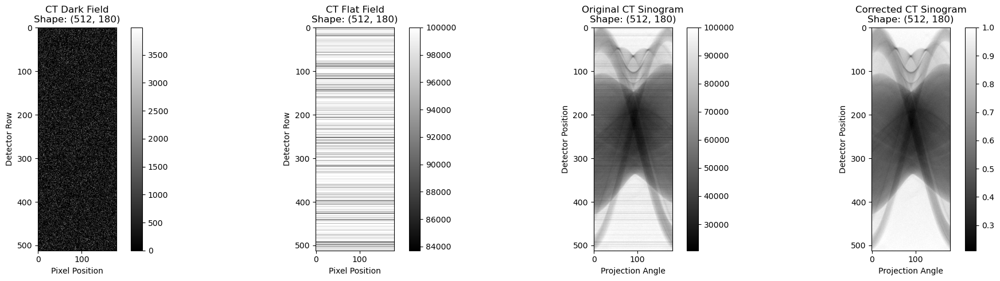

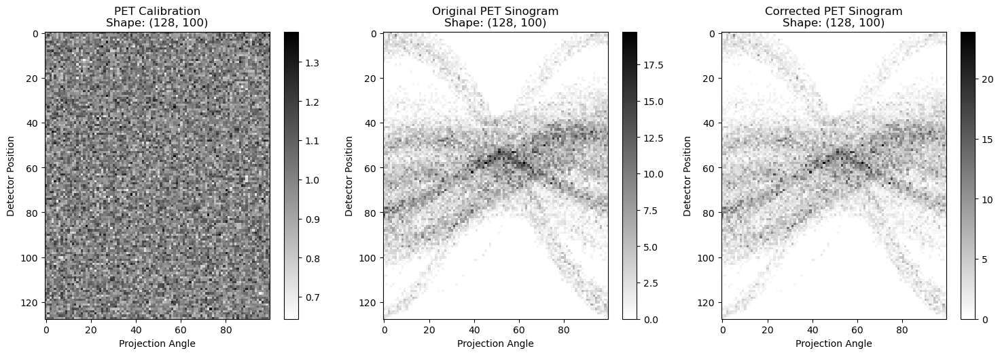

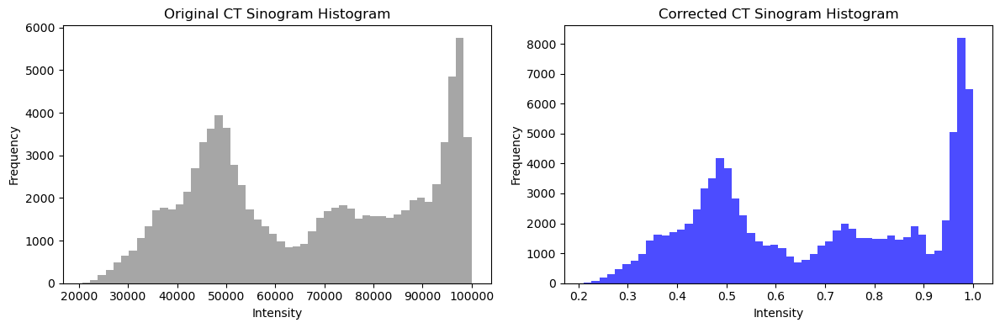

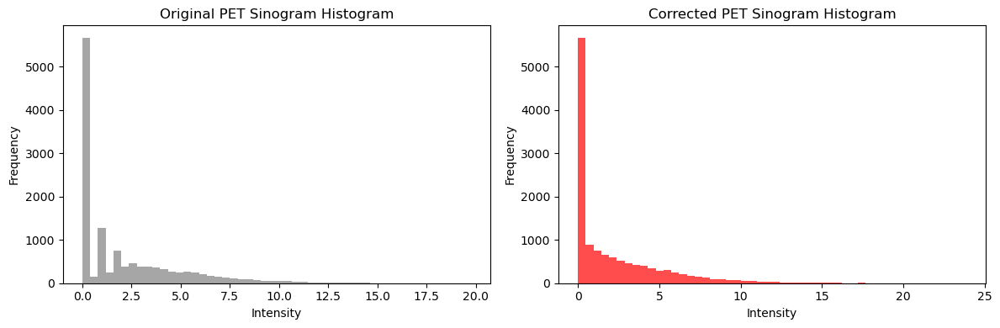

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import os
import logging

# Setup logging
logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s")
logger = logging.getLogger()

# === 1. Path setup ===
data_path = "../data/Module1/"
output_path = os.path.join(data_path, "processed")
os.makedirs(output_path, exist_ok=True)

# === 2. Load data ===
try:
    ct_sino = np.load(os.path.join(data_path, "ct_sinogram.npy"))
    ct_dark = np.load(os.path.join(data_path, "ct_dark.npy"))
    ct_flat = np.load(os.path.join(data_path, "ct_flat.npy"))
    
    pet_sino = np.load(os.path.join(data_path, "pet_sinogram.npy"))
    pet_calibration = np.load(os.path.join(data_path, "pet_calibration.npy"))
    
    logger.info("All data loaded successfully.")
except Exception as e:
    logger.error(f"Failed to load data: {e}")
    raise

# === 3. CT correction ===
epsilon = 1e-10
ct_corrected = (ct_sino - ct_dark) / np.maximum(ct_flat - ct_dark, epsilon)
logger.info("CT sinogram correction completed.")

# === 4. PET correction ===
pet_corrected = pet_sino / np.maximum(pet_calibration, epsilon)
logger.info("PET sinogram correction completed.")

# === 5. Save corrected results ===
np.save(os.path.join(output_path, "ct_sino_corrected.npy"), ct_corrected)
np.save(os.path.join(output_path, "pet_sino_corrected.npy"), pet_corrected)
logger.info("Corrected data saved successfully.")

# === 6. Visualization - CT images ===
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

im1 = axes[0].imshow(ct_dark, cmap="gray")
axes[0].set_title(f"CT Dark Field\nShape: {ct_dark.shape}", fontsize=12)
axes[0].set_xlabel("Pixel Position")
axes[0].set_ylabel("Detector Row")
plt.colorbar(im1, ax=axes[0])

im2 = axes[1].imshow(ct_flat, cmap="gray")
axes[1].set_title(f"CT Flat Field\nShape: {ct_flat.shape}", fontsize=12)
axes[1].set_xlabel("Pixel Position")
axes[1].set_ylabel("Detector Row")
plt.colorbar(im2, ax=axes[1])

im3 = axes[2].imshow(ct_sino, cmap="gray")
axes[2].set_title(f"Original CT Sinogram\nShape: {ct_sino.shape}", fontsize=12)
axes[2].set_xlabel("Projection Angle")
axes[2].set_ylabel("Detector Position")
plt.colorbar(im3, ax=axes[2])

im4 = axes[3].imshow(ct_corrected, cmap="gray")
axes[3].set_title(f"Corrected CT Sinogram\nShape: {ct_corrected.shape}", fontsize=12)
axes[3].set_xlabel("Projection Angle")
axes[3].set_ylabel("Detector Position")
plt.colorbar(im4, ax=axes[3])

plt.tight_layout()
plt.savefig(os.path.join(output_path, "ct_sinograms.png"), dpi=300, bbox_inches="tight")
plt.show()

# === 7. Visualization - PET images ===
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

im5 = axes[0].imshow(pet_calibration, cmap="gray_r")
axes[0].set_title(f"PET Calibration\nShape: {pet_calibration.shape}", fontsize=12)
axes[0].set_xlabel("Projection Angle")
axes[0].set_ylabel("Detector Position")
plt.colorbar(im5, ax=axes[0])

im6 = axes[1].imshow(pet_sino, cmap="gray_r")
axes[1].set_title(f"Original PET Sinogram\nShape: {pet_sino.shape}", fontsize=12)
axes[1].set_xlabel("Projection Angle")
axes[1].set_ylabel("Detector Position")
plt.colorbar(im6, ax=axes[1])

im7 = axes[2].imshow(pet_corrected, cmap="gray_r")
axes[2].set_title(f"Corrected PET Sinogram\nShape: {pet_corrected.shape}", fontsize=12)
axes[2].set_xlabel("Projection Angle")
axes[2].set_ylabel("Detector Position")
plt.colorbar(im7, ax=axes[2])

plt.tight_layout()
plt.savefig(os.path.join(output_path, "pet_sinograms.png"), dpi=300, bbox_inches="tight")
plt.show()

# === 8. Histogram - CT ===
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(ct_sino.flatten(), bins=50, color='gray', alpha=0.7)
axes[0].set_title("Original CT Sinogram Histogram")
axes[0].set_xlabel("Intensity")
axes[0].set_ylabel("Frequency")

axes[1].hist(ct_corrected.flatten(), bins=50, color='blue', alpha=0.7)
axes[1].set_title("Corrected CT Sinogram Histogram")
axes[1].set_xlabel("Intensity")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.savefig(os.path.join(output_path, "ct_histogram.png"), dpi=300, bbox_inches="tight")
plt.show()

# === 9. Histogram - PET ===
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(pet_sino.flatten(), bins=50, color='gray', alpha=0.7)
axes[0].set_title("Original PET Sinogram Histogram")
axes[0].set_xlabel("Intensity")
axes[0].set_ylabel("Frequency")

axes[1].hist(pet_corrected.flatten(), bins=50, color='red', alpha=0.7)
axes[1].set_title("Corrected PET Sinogram Histogram")
axes[1].set_xlabel("Intensity")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.savefig(os.path.join(output_path, "pet_histogram.png"), dpi=300, bbox_inches="tight")
plt.show()

### Ex1.2: CT Image Reconstruction using FBP, OS-SART, and SIRT

We reconstruct a CT image from the processed sinogram using:  
1. Filtered Back Projection (FBP)
2. Ordered Subset Simultaneous Algebraic Reconstruction Technique (OS-SART)
3. Simultaneous Iterative Reconstruction Technique (SIRT)

To evaluate the quality of each reconstruction, we conduct a grid search over different **relaxation parameters ($\gamma$)** and **iteration counts ($K$)** in OS-SART, selecting the optimal parameters based on two metrics: **Forward Projection Error Convergence** and **Update Norm per Iteration**.

---

**1. Data Preprocessing**
- The corrected CT sinogram is loaded from the preprocessed dataset.
- A negative logarithm transformation is applied to convert intensity measurements into attenuation coefficients:
  $$
  p = -\log(I_{cleaned})
  $$
- The sinogram angles are defined as $\theta = [0^\circ, 180^\circ]$, sampled at 1° per step.

---

**2. Reconstruction Methods**

**Filtered Back Projection (FBP)**
- Implemented using `iradon()` with the **ramp filter**.
- Acts as a baseline reconstruction method.

**OS-SART Reconstruction**

OS-SART is an iterative reconstruction algorithm that models the CT system as a large system of linear equations:

$$Ax = b$$

Where:
- $A$ is the system matrix representing the forward projection
- $x$ is the unknown image
- $b$ is the measured projection data (sinogram)

OS-SART divides the projection data into ordered subsets and updates the reconstruction after processing each subset:

$$x^{k+1} = x^k + \gamma \cdot A_i^T(A_i x^k - b_i)$$

Where:
- $k$ is the iteration number
- $i$ denotes the subset index
- $\gamma$ is the relaxation parameter
- $A_i$ and $b_i$ are the system matrix and measurements for subset $i$


Grid search over $(\gamma, K)$:
  - $\gamma$ values: [0.001, 0.005, 0.01, 0.05, 0.1, 0.3, 0.5]
  - $K$ values: [5, 10, 20, 30, 50, 100, 200]
- The sinogram angles are split into **10 subsets**, and OS-SART iterates through them in a randomized order.
- The best $(\gamma, K)$ pair is selected based on the highest combined score.

**SIRT Reconstruction**
- SIRT is a gradient descent-based iterative reconstruction method.
- The reconstruction is refined iteratively using:
  $$
  x_{k+1} = x_k + \gamma \cdot A^T (b - Ax_k)
  $$
- **Fixed $\gamma = 0.001$**, evaluated over different iteration counts for comparison.

---

**4. Visualization & Analysis**
- Final OS-SART and SIRT reconstructions are compared against FBP.
- Difference maps (OS-SART - FBP, SIRT - FBP) highlight variations.
- Convergence curves for OS-SART and SIRT across iterations.
- All OS-SART reconstructions from the grid search are displayed for manual inspection.

---

**5. Conclusion**
- **FBP** provides a baseline reconstruction but may introduce artifacts.
- **OS-SART** allows for iterative refinement, with optimal $(\gamma, K)$ selected to balance noise suppression and detail preservation.
- **SIRT** offers an alternative iterative method, compared across different iterations with more computing cost.



In [89]:
import numpy as np
import matplotlib.pyplot as plt
import os, time, logging
from skimage.transform import radon, iradon, iradon_sart
from tqdm import tqdm

# -------------------------- 1. Initialization: Logging and Paths --------------------------
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)
data_path = "../data/Module1/processed/"
output_path = "../data/Module1/processed/reconstruction/"
os.makedirs(output_path, exist_ok=True)

# -------------------------- 2. Data Preprocessing --------------------------
ct_sino = np.load(os.path.join(data_path, "ct_sino_corrected.npy"))
epsilon = 1e-10
ct_sino = np.clip(ct_sino, epsilon, None)
ct_sino = -np.log(ct_sino)  # Convert to attenuation coefficients
theta = np.linspace(0., 180., ct_sino.shape[1], endpoint=False)

# -------------------------- 3. FBP Reconstruction (for comparison) --------------------------
fbp_start = time.time()
fbp_reconstruction = iradon(ct_sino, theta=theta, filter_name="ramp", circle=True)
logger.info(f"FBP reconstruction completed in {time.time()-fbp_start:.2f} seconds")

# -------------------------- 4. OS-SART Grid Search with Early Stopping --------------------------
os_sart_gamma_values = [0.001, 0.005, 0.01, 0.05, 0.1]
iteration_values = [5, 10, 20, 30, 50, 100, 200]
num_subsets = 10
subset_size = len(theta) // num_subsets

# Divide theta into 10 subsets
subsets = [theta[i * subset_size: (i + 1) * subset_size] for i in range(num_subsets - 1)]
subsets.append(theta[(num_subsets - 1) * subset_size:])

# Containers to store results for each parameter combination
os_sart_reconstructions = {}   # Reconstructed images
os_sart_conv_curves = {}       # L2 norm differences between successive iterations
os_sart_loss_curves = {}       # Forward projection error curves (true loss)

logger.info("Starting OS-SART grid search with early stopping...")
total_candidates = len(os_sart_gamma_values) * len(iteration_values)
pbar = tqdm(total=total_candidates, desc="OS-SART grid search")

for gamma in os_sart_gamma_values:
    for max_iter in iteration_values:
        reconstruction = np.zeros_like(fbp_reconstruction)
        conv_curve = []  # Store L2 differences
        loss_curve = []  # Store true loss values
        prev_prev_diff = None
        prev_diff = None
        
        for it in range(max_iter):
            current = reconstruction.copy()
            # Randomly shuffle subset order for updates
            for subset_idx in np.random.permutation(num_subsets):
                subset_theta = subsets[subset_idx]
                # Get corresponding subset of sinogram (handle last subset size)
                start_idx = subset_idx * subset_size
                end_idx = (subset_idx + 1) * subset_size if subset_idx < num_subsets - 1 else ct_sino.shape[1]
                subset_sino = ct_sino[:, start_idx:end_idx]
                reconstruction = iradon_sart(subset_sino, theta=subset_theta,
                                             image=reconstruction, relaxation=gamma)
            
            # Compute L2 norm difference from previous iteration
            curr_diff = np.linalg.norm(reconstruction - current)
            conv_curve.append(curr_diff)
            
            # Compute true projection loss (forward error relative to original sinogram)
            sino_estimate = radon(reconstruction, theta=theta, circle=True)
            true_loss = np.linalg.norm(sino_estimate - ct_sino) / np.linalg.norm(ct_sino)
            loss_curve.append(true_loss)
            
            logger.info(f"OS-SART: gamma={gamma}, planned iter={max_iter}, iteration {it+1}/{max_iter}: diff = {curr_diff:.6f}, Loss = {true_loss:.6f}")
            
            # Early stopping: stop if three consecutive diffs are all < 1e-6
            if prev_diff is not None and prev_prev_diff is not None:
                if curr_diff < 1e-6 and prev_diff < 1e-6 and prev_prev_diff < 1e-6:
                    logger.info(f"Early stopping OS-SART: gamma={gamma}, planned iter={max_iter} at iteration {it+1} with three consecutive small diffs")
                    break
            
            # Update previous differences
            prev_prev_diff = prev_diff
            prev_diff = curr_diff
        
        os_sart_conv_curves[(gamma, max_iter)] = conv_curve
        os_sart_loss_curves[(gamma, max_iter)] = loss_curve
        os_sart_reconstructions[(gamma, max_iter)] = reconstruction.copy()
        pbar.update(1)
pbar.close()


2025-04-03 21:32:35,058 - INFO - FBP reconstruction completed in 0.36 seconds
2025-04-03 21:32:35,107 - INFO - Starting OS-SART grid search with early stopping...
OS-SART grid search:   0%|          | 0/35 [00:00<?, ?it/s]/Users/tinah/projects/dis_cw/term2/medical_imaging/env/lib/python3.10/site-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(
2025-04-03 21:32:36,471 - INFO - OS-SART: gamma=0.001, planned iter=5, iteration 1/5: diff = 0.234587, Loss = 0.673404
2025-04-03 21:32:37,921 - INFO - OS-SART: gamma=0.001, planned iter=5, iteration 2/5: diff = 0.154417, Loss = 0.466003
2025-04-03 21:32:39,442 - INFO - OS-SART: gamma=0.001, planned iter=5, iteration 3/5: diff = 0.103182, Loss = 0.335726
2025-04-03 21:32:40,869 - INFO - OS-SART: gamma=0.001, planned iter=5, iteration 4/5: diff = 0.069953, Loss = 0.255269
2025-04-03 21:32:41,959 - INFO - OS-SART: gamma=0.001, planned iter=5, iteration 5/5: 

In [111]:
# -------------------------- 5. SIRT Grid Search (with Early Stopping) --------------------------
sirt_gamma_values = [0.00005, 0.0001, 0.001, 0.002, 0.003]  # Different gamma values as OS-SART
iteration_values = [5, 10, 20, 30, 50, 100, 200]
sirt_results = {}   # Store SIRT reconstruction results for different parameters
sirt_conv_curves = {}  # Store SIRT L2 differences
sirt_loss_curves = {}  # Store SIRT true loss values

logger.info("Starting SIRT grid search with early stopping...")
total_candidates = len(sirt_gamma_values) * len(iteration_values)
pbar = tqdm(total=total_candidates, desc="SIRT grid search")

for gamma in sirt_gamma_values:
    for iter_val in iteration_values:
        sirt_image = np.zeros_like(fbp_reconstruction)
        conv_curve = []
        loss_curve = []
        prev_prev_diff = None
        prev_diff = None
        
        for it in range(iter_val):
            current = sirt_image.copy()
            residual = ct_sino - radon(sirt_image, theta=theta, circle=True)
            gradient = gamma * iradon(residual, theta=theta, filter_name=None, circle=True)
            sirt_image += gradient
            
            curr_diff = np.linalg.norm(sirt_image - current)
            conv_curve.append(curr_diff)
            
            # Calculate true loss
            sino_estimate = radon(sirt_image, theta=theta, circle=True)
            true_loss = np.linalg.norm(sino_estimate - ct_sino) / np.linalg.norm(ct_sino)
            loss_curve.append(true_loss)
            
            # Log each iteration's difference and true loss
            logger.info(f"SIRT: gamma={gamma}, iter={iter_val}, iteration {it+1}/{iter_val}: diff = {curr_diff:.6f}, Loss = {true_loss:.6f}")
            
            # Early stopping check - three consecutive iterations with changes less than 10^-6
            if prev_diff is not None and prev_prev_diff is not None:
                if curr_diff < 1e-6 and prev_diff < 1e-6 and prev_prev_diff < 1e-6:
                    logger.info(f"Early stopping SIRT: gamma={gamma}, planned iter={iter_val} at iteration {it+1} with three consecutive small diffs")
                    break
            
            # Update historical difference values
            prev_prev_diff = prev_diff
            prev_diff = curr_diff
            
        sirt_conv_curves[(gamma, iter_val)] = conv_curve
        sirt_loss_curves[(gamma, iter_val)] = loss_curve
        sirt_results[(gamma, iter_val)] = sirt_image.copy()
        pbar.update(1)
pbar.close()

2025-04-03 23:34:13,213 - INFO - Starting SIRT grid search with early stopping...
SIRT grid search:   0%|          | 0/35 [00:00<?, ?it/s]2025-04-03 23:34:14,251 - INFO - SIRT: gamma=5e-05, iter=5, iteration 1/5: diff = 0.019744, Loss = 0.970179
2025-04-03 23:34:16,157 - INFO - SIRT: gamma=5e-05, iter=5, iteration 2/5: diff = 0.019086, Loss = 0.941457
2025-04-03 23:34:17,023 - INFO - SIRT: gamma=5e-05, iter=5, iteration 3/5: diff = 0.018452, Loss = 0.913795
2025-04-03 23:34:18,008 - INFO - SIRT: gamma=5e-05, iter=5, iteration 4/5: diff = 0.017840, Loss = 0.887157
2025-04-03 23:34:18,967 - INFO - SIRT: gamma=5e-05, iter=5, iteration 5/5: diff = 0.017250, Loss = 0.861508
SIRT grid search:   3%|▎         | 1/35 [00:05<03:15,  5.74s/it]2025-04-03 23:34:19,848 - INFO - SIRT: gamma=5e-05, iter=10, iteration 1/10: diff = 0.019744, Loss = 0.970179
2025-04-03 23:34:20,716 - INFO - SIRT: gamma=5e-05, iter=10, iteration 2/10: diff = 0.019086, Loss = 0.941457
2025-04-03 23:34:21,542 - INFO - SIRT:

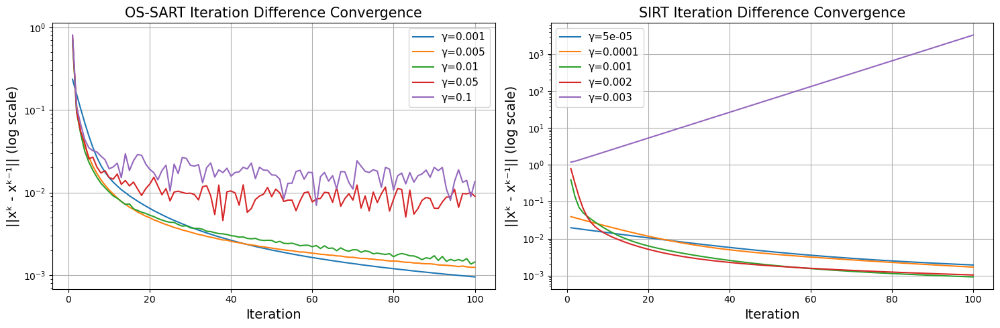

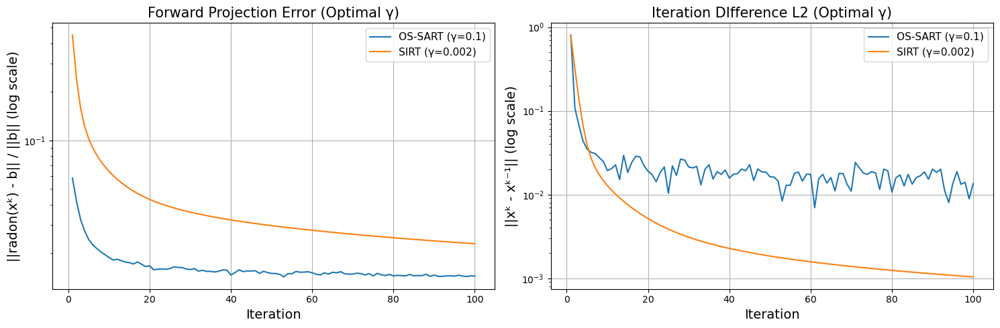

In [214]:
import matplotlib.pyplot as plt
import numpy as np

# --- Row 1: Solution Update Magnitude with Different Gamma Values ---
plt.figure(figsize=(15, 5))

# (A1) OS-SART L2 convergence curves
plt.subplot(1, 2, 1)
for gamma in os_sart_gamma_values:
    if (gamma, 100) in os_sart_conv_curves:
        curve = os_sart_conv_curves[(gamma, 100)]
        iterations = min(len(curve), 100)
        plt.plot(range(1, iterations+1), curve[:iterations], label=f'γ={gamma}')

plt.title('OS-SART Iteration Difference Convergence', fontsize=15)
plt.xlabel('Iteration', fontsize=14)
plt.ylabel('||xᵏ - xᵏ⁻¹|| (log scale)', fontsize=14)
plt.yscale('log')
handles, labels = plt.gca().get_legend_handles_labels()
if handles:
    plt.legend(fontsize=11)
plt.grid(True)

# (A2) SIRT L2 convergence curves
plt.subplot(1, 2, 2)
for gamma in sirt_gamma_values:
    if (gamma, 100) in sirt_conv_curves:
        curve = sirt_conv_curves[(gamma, 100)]
        iterations = min(len(curve), 100)
        plt.plot(range(1, iterations+1), curve[:iterations], label=f'γ={gamma}')

plt.title('SIRT Iteration Difference Convergence', fontsize=15)
plt.xlabel('Iteration', fontsize=14)
plt.ylabel('||xᵏ - xᵏ⁻¹|| (log scale)', fontsize=14)
plt.yscale('log')
handles, labels = plt.gca().get_legend_handles_labels()
if handles:
    plt.legend(fontsize=11)
plt.grid(True)

plt.tight_layout()
# plt.savefig(output_path,"convergence_update_magnitude.png", dpi=300, bbox_inches='tight')
plt.show()

# --- Row 2: Merge B2 and C2 ---
plt.figure(figsize=(15, 5))

# (B2) Forward Projection Error (optimal γ per method) on left
plt.subplot(1, 2, 1)
os_sart_optimal_gamma = 0.1
sirt_optimal_gamma = 0.002

if (os_sart_optimal_gamma, 100) in os_sart_loss_curves:
    os_sart_errors = os_sart_loss_curves[(os_sart_optimal_gamma, 100)]
    iterations = min(len(os_sart_errors), 100)
    plt.plot(range(1, iterations+1), os_sart_errors[:iterations], label=f'OS-SART (γ={os_sart_optimal_gamma})')

if (sirt_optimal_gamma, 100) in sirt_loss_curves:
    sirt_errors = sirt_loss_curves[(sirt_optimal_gamma, 100)]
    iterations = min(len(sirt_errors), 100)
    plt.plot(range(1, iterations+1), sirt_errors[:iterations], label=f'SIRT (γ={sirt_optimal_gamma})')

plt.title('Forward Projection Error (Optimal γ)', fontsize=15)
plt.xlabel('Iteration', fontsize=14)
plt.ylabel('||radon(xᵏ) - b|| / ||b|| (log scale)', fontsize=14)
plt.yscale('log')
handles, labels = plt.gca().get_legend_handles_labels()
if handles:
    plt.legend(fontsize=11)
plt.grid(True)

# (C2) Iteration Difference (optimal γ per method) on right
plt.subplot(1, 2, 2)
if (os_sart_optimal_gamma, 100) in os_sart_conv_curves:
    os_sart_diffs = os_sart_conv_curves[(os_sart_optimal_gamma, 100)]
    iterations = min(len(os_sart_diffs), 100)
    plt.plot(range(1, iterations+1), os_sart_diffs[:iterations], label=f'OS-SART (γ={os_sart_optimal_gamma})')

if (sirt_optimal_gamma, 100) in sirt_conv_curves:
    sirt_diffs = sirt_conv_curves[(sirt_optimal_gamma, 100)]
    iterations = min(len(sirt_diffs), 100)
    plt.plot(range(1, iterations+1), sirt_diffs[:iterations], label=f'SIRT (γ={sirt_optimal_gamma})')

plt.title('Iteration DIfference L2 (Optimal γ)', fontsize=15)
plt.xlabel('Iteration', fontsize=14)
plt.ylabel('||xᵏ - xᵏ⁻¹|| (log scale)', fontsize=14)
plt.yscale('log')
handles, labels = plt.gca().get_legend_handles_labels()
if handles:
    plt.legend(fontsize=11)
plt.grid(True)

plt.tight_layout()
# plt.savefig(output_path, "convergence_projection_vs_update.png", dpi=300, bbox_inches='tight')
plt.show()


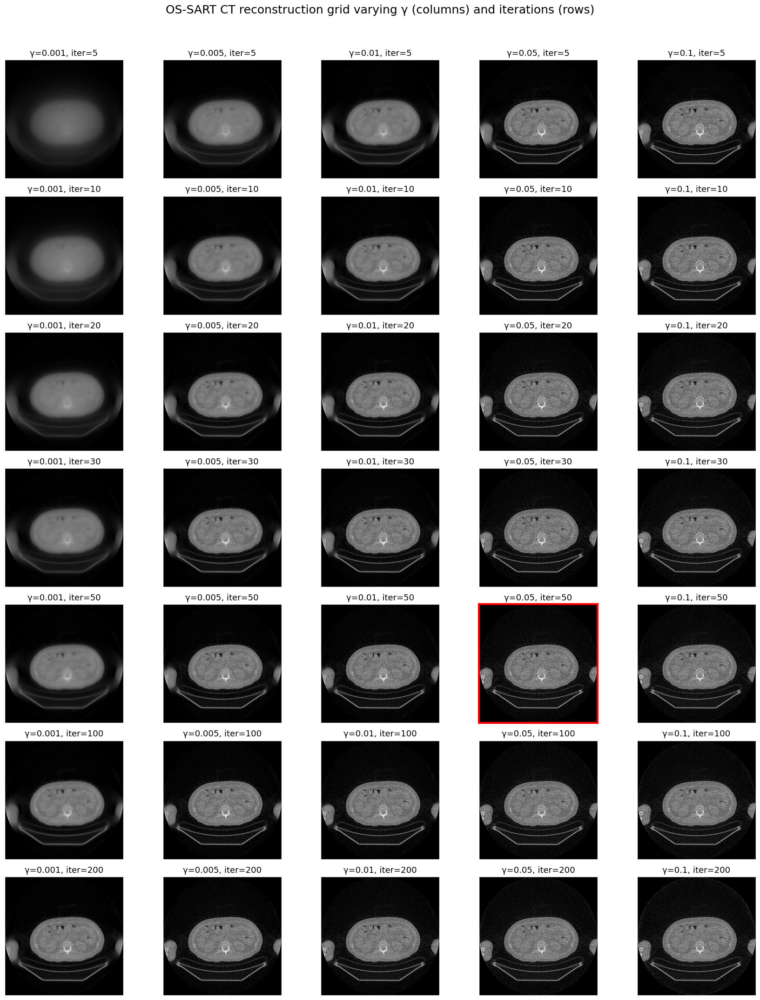

In [122]:
# -------------------------- Grid Search Series Visualization --------------------------
# (A) OS-SART Grid Search Series: Organized by gamma values in columns
import matplotlib.patches as patches

os_sart_selected_gammas = [0.001, 0.005, 0.01, 0.05, 0.1]
rows = len(iteration_values)
cols = len(os_sart_selected_gammas)
fig, axes = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 3))
fig.suptitle("OS-SART CT reconstruction grid varying γ (columns) and iterations (rows)", fontsize=18, y=1.02)

for ax in axes.flatten():
    ax.grid(False)

for col_idx, gamma in enumerate(os_sart_selected_gammas):
    for row_idx, iter_val in enumerate(iteration_values):
        if (gamma, iter_val) in os_sart_reconstructions:
            rec = os_sart_reconstructions[(gamma, iter_val)]
            im = axes[row_idx, col_idx].imshow(rec, cmap="gray")
            axes[row_idx, col_idx].set_title(f"γ={gamma}, iter={iter_val}", fontsize=13)
            im.set_clim(0, 0.007)

            axes[row_idx, col_idx].set_xticks([])
            axes[row_idx, col_idx].set_yticks([])

            # Draw a red border around the chosen result
            if gamma == 0.05 and iter_val == 50:
                for spine in axes[row_idx, col_idx].spines.values():
                    spine.set_edgecolor('red')
                    spine.set_linewidth(3)

plt.tight_layout(rect=[0, 0, 1, 1])
plt.savefig(os.path.join(output_path, "os_sart_series_by_gamma.png"), dpi=300)
plt.show()

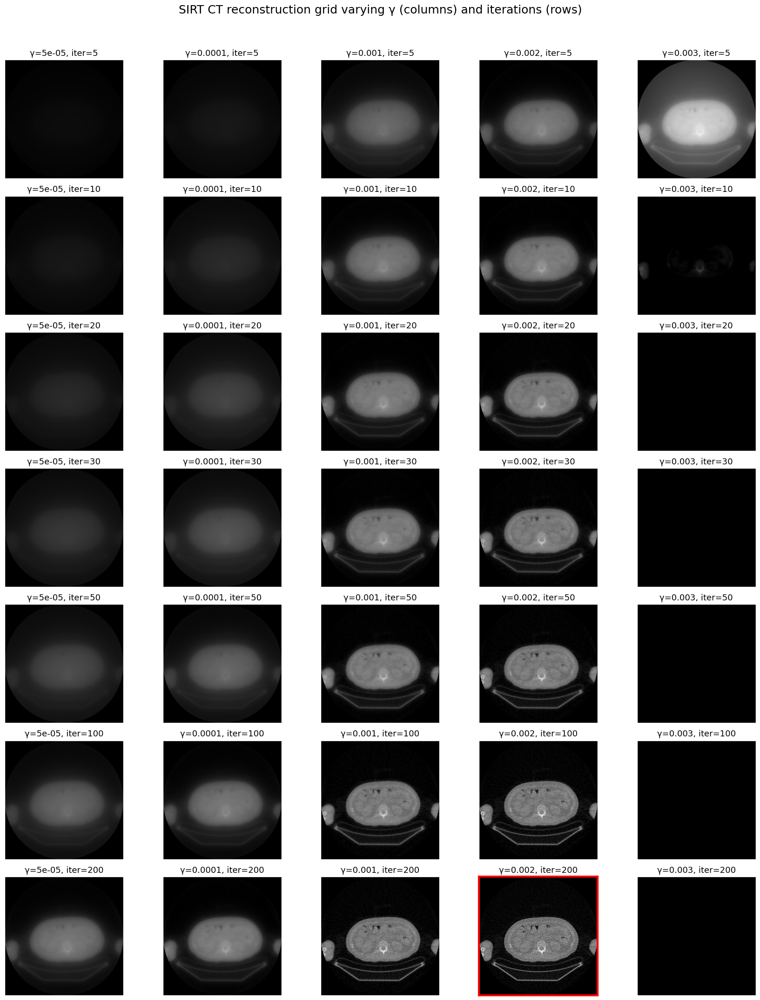

In [120]:
# (B) SIRT Grid Search Series: Organized by gamma values in columns


import matplotlib.patches as patches
# sirt_gamma_values = [0.00005, 0.0001, 0.001, 0.002, 0.003]  # Different gamma values as OS-SART

sirt_selected_gammas = [0.00005, 0.0001, 0.001, 0.002, 0.003] 
rows = len(iteration_values)
cols = len(sirt_selected_gammas)
fig, axes = plt.subplots(rows, cols, figsize=(cols*3.5, rows*3))
fig.suptitle("SIRT CT reconstruction grid varying γ (columns) and iterations (rows)", fontsize=18, y=1.02)

for ax in axes.flatten():
    ax.grid(False)

for col_idx, gamma in enumerate(sirt_selected_gammas):
    for row_idx, iter_val in enumerate(iteration_values):
        if (gamma, iter_val) in sirt_results:
            rec = sirt_results[(gamma, iter_val)]
            im = axes[row_idx, col_idx].imshow(rec, cmap="gray")
            axes[row_idx, col_idx].set_title(f"γ={gamma}, iter={iter_val}", fontsize=13)
            im.set_clim(0, 0.007)
            axes[row_idx, col_idx].set_xticks([])
            axes[row_idx, col_idx].set_yticks([])

            # final parameter
            if gamma == 0.002 and iter_val == 200:
                for spine in axes[row_idx, col_idx].spines.values():
                    spine.set_edgecolor('red')
                    spine.set_linewidth(3)

plt.tight_layout(rect=[0, 0, 1, 1])
plt.savefig(os.path.join(output_path, "sirt_series_by_gamma.png"), dpi=300)
plt.show()


In [143]:
# -------------------------- Save Grid Search Results and Parameters --------------------------
logger.info("Saving grid search results and parameters...")

# Create a more specific subdirectory for these results
grid_results_path = os.path.join(output_path, "ct_grid_search_results")
os.makedirs(grid_results_path, exist_ok=True)

# Save FBP reconstruction
np.save(os.path.join(output_path, "fbp_reconstruction.npy"), fbp_reconstruction)

# Save OS-SART grid search results
os_sart_params_file = os.path.join(grid_results_path, "os_sart_parameters.txt")
with open(os_sart_params_file, "w") as f:
    f.write("OS-SART Grid Search Parameters:\n")
    f.write(f"Gamma values: {os_sart_gamma_values}\n")
    f.write(f"Iteration values: {iteration_values}\n")
    f.write(f"Number of subsets: {num_subsets}\n\n")
    
    # Write the loss for each parameter combination
    f.write("Parameter combinations and final losses:\n")
    for (gamma, iters), loss_curve in os_sart_loss_curves.items():
        final_loss = loss_curve[-1] if loss_curve else float('inf')
        f.write(f"gamma={gamma}, iterations={iters}: final_loss={final_loss:.6f}\n")

# Save SIRT grid search results
sirt_params_file = os.path.join(grid_results_path, "sirt_parameters.txt")
with open(sirt_params_file, "w") as f:
    f.write("SIRT Grid Search Parameters:\n")
    f.write(f"Gamma values: {sirt_gamma_values}\n")
    f.write(f"Iteration values: {iteration_values}\n\n")
    
    # Write the loss for each parameter combination
    f.write("Parameter combinations and final losses:\n")
    for (gamma, iters), loss_curve in sirt_loss_curves.items():
        final_loss = loss_curve[-1] if loss_curve else float('inf')
        f.write(f"gamma={gamma}, iterations={iters}: final_loss={final_loss:.6f}\n")

# Save the best OS-SART and SIRT reconstructions based on lowest final loss
best_os_sart_params = min(os_sart_loss_curves.keys(), 
                        key=lambda k: os_sart_loss_curves[k][-1] if os_sart_loss_curves[k] else float('inf'))
best_sirt_params = min(sirt_loss_curves.keys(), 
                      key=lambda k: sirt_loss_curves[k][-1] if sirt_loss_curves[k] else float('inf'))

best_os_sart_gamma, best_os_sart_iters = best_os_sart_params
best_sirt_gamma, best_sirt_iters = best_sirt_params

# Save best reconstructions
np.save(os.path.join(output_path, "best_os_sart_reconstruction.npy"), 
        os_sart_reconstructions[best_os_sart_params])
np.save(os.path.join(output_path, "best_sirt_reconstruction.npy"), 
        sirt_results[best_sirt_params])

# Save your specified parameter reconstructions
target_os_sart_params = (0.05, 50)
target_sirt_params = (0.002, 200)

# Check if these parameters exist in our grid search results
if target_os_sart_params in os_sart_reconstructions:
    np.save(os.path.join(output_path, "target_os_sart_reconstruction.npy"), 
            os_sart_reconstructions[target_os_sart_params])
    logger.info(f"Saved target OS-SART reconstruction with gamma={target_os_sart_params[0]}, iter={target_os_sart_params[1]}")
else:
    logger.warning(f"Target OS-SART parameters {target_os_sart_params} not found in grid search results")

if target_sirt_params in sirt_results:
    np.save(os.path.join(output_path, "target_sirt_reconstruction.npy"), 
            sirt_results[target_sirt_params])
    logger.info(f"Saved target SIRT reconstruction with gamma={target_sirt_params[0]}, iter={target_sirt_params[1]}")
else:
    logger.warning(f"Target SIRT parameters {target_sirt_params} not found in grid search results")

# Save all the reconstruction results
for params, recon in os_sart_reconstructions.items():
    gamma, iters = params
    np.save(os.path.join(grid_results_path, f"os_sart_gamma{gamma}_iter{iters}.npy"), recon)

for params, recon in sirt_results.items():
    gamma, iters = params
    np.save(os.path.join(grid_results_path, f"sirt_gamma{gamma}_iter{iters}.npy"), recon)

# Save convergence curves
for params, curve in os_sart_conv_curves.items():
    gamma, iters = params
    np.save(os.path.join(grid_results_path, f"os_sart_conv_curve_gamma{gamma}_iter{iters}.npy"), 
            np.array(curve))

for params, curve in sirt_conv_curves.items():
    gamma, iters = params
    np.save(os.path.join(grid_results_path, f"sirt_conv_curve_gamma{gamma}_iter{iters}.npy"), 
            np.array(curve))

# Save loss curves
for params, curve in os_sart_loss_curves.items():
    gamma, iters = params
    np.save(os.path.join(grid_results_path, f"os_sart_loss_curve_gamma{gamma}_iter{iters}.npy"), 
            np.array(curve))

for params, curve in sirt_loss_curves.items():
    gamma, iters = params
    np.save(os.path.join(grid_results_path, f"sirt_loss_curve_gamma{gamma}_iter{iters}.npy"), 
            np.array(curve))

# Save a summary of the best parameters
with open(os.path.join(output_path, "best_parameters.txt"), "w") as f:
    f.write("Best Parameters Based on Lowest Final Loss:\n")
    f.write(f"OS-SART: gamma={best_os_sart_gamma}, iterations={best_os_sart_iters}, " 
            f"final_loss={os_sart_loss_curves[best_os_sart_params][-1]:.6f}\n")
    f.write(f"SIRT: gamma={best_sirt_gamma}, iterations={best_sirt_iters}, "
            f"final_loss={sirt_loss_curves[best_sirt_params][-1]:.6f}\n\n")
    
    f.write("Target Parameters for Visualization:\n")
    f.write(f"OS-SART: gamma=0.05, iterations=50\n")
    f.write(f"SIRT: gamma=0.002, iterations=200\n")

logger.info(f"All grid search results and reconstructions saved to {output_path}")
logger.info(f"Detailed parameter data saved to {grid_results_path}")
logger.info(f"Best OS-SART parameters: gamma={best_os_sart_gamma}, iterations={best_os_sart_iters}")
logger.info(f"Best SIRT parameters: gamma={best_sirt_gamma}, iterations={best_sirt_iters}")

2025-04-04 02:04:00,598 - INFO - Saving grid search results and parameters...
2025-04-04 02:04:00,692 - INFO - Saved target OS-SART reconstruction with gamma=0.05, iter=50
2025-04-04 02:04:00,700 - INFO - Saved target SIRT reconstruction with gamma=0.002, iter=200
2025-04-04 02:04:01,735 - INFO - All grid search results and reconstructions saved to ../data/Module1/processed/reconstruction/
2025-04-04 02:04:01,752 - INFO - Detailed parameter data saved to ../data/Module1/processed/reconstruction/grid_search_results
2025-04-04 02:04:01,754 - INFO - Best OS-SART parameters: gamma=0.05, iterations=200
2025-04-04 02:04:01,756 - INFO - Best SIRT parameters: gamma=0.002, iterations=200


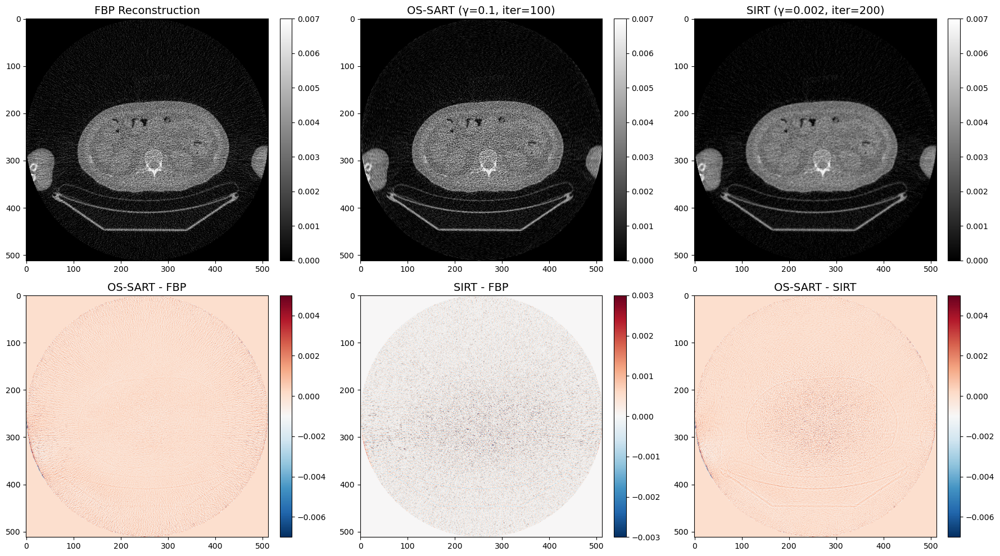

In [146]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Define paths
data_path = "../data/Module1/processed/"
output_path = "../data/Module1/processed/reconstruction/"
os.makedirs(output_path, exist_ok=True)

# Parameters specified for the reconstructions
os_sart_gamma = 0.1
os_sart_iters = 100
sirt_gamma = 0.002
sirt_iters = 200

# Load the previously computed reconstructions
# Assuming these are available from your grid search results
fbp_reconstruction = np.load(os.path.join(output_path, "fbp_reconstruction.npy"))
os_sart_recon = os_sart_reconstructions[(os_sart_gamma, os_sart_iters)]
sirt_recon = sirt_results[(sirt_gamma, sirt_iters)]

# Calculate differences between methods
os_sart_minus_fbp = os_sart_recon - fbp_reconstruction
sirt_minus_fbp = sirt_recon - fbp_reconstruction
os_sart_minus_sirt = os_sart_recon - sirt_recon

# Create 2x3 figure layout as shown in the screenshot
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
plt.subplots_adjust(wspace=0.02, hspace=0.02)

# Plot reconstructions (top row)
# FBP Reconstruction
im1 = axes[0, 0].imshow(fbp_reconstruction, cmap='gray', vmin=0, vmax=0.007)
axes[0, 0].set_title('FBP Reconstruction', fontsize=14)
# axes[0, 0].set_ylabel('y-coordinate', fontsize=12)
cbar1 = plt.colorbar(im1, ax=axes[0, 0], fraction=0.046, pad=0.04)

# OS-SART Reconstruction
im2 = axes[0, 1].imshow(os_sart_recon, cmap='gray', vmin=0, vmax=0.007)
axes[0, 1].set_title(f'OS-SART (γ={os_sart_gamma}, iter={os_sart_iters})', fontsize=14)
cbar2 = plt.colorbar(im2, ax=axes[0, 1], fraction=0.046, pad=0.04)

# SIRT Reconstruction
im3 = axes[0, 2].imshow(sirt_recon, cmap='gray', vmin=0, vmax=0.007)
axes[0, 2].set_title(f'SIRT (γ={sirt_gamma}, iter={sirt_iters})', fontsize=14)
cbar3 = plt.colorbar(im3, ax=axes[0, 2], fraction=0.046, pad=0.04)

# Plot differences (bottom row)
# OS-SART - FBP
im4 = axes[1, 0].imshow(os_sart_minus_fbp, cmap='RdBu_r', vmin=-0.007, vmax=0.005)
axes[1, 0].set_title('OS-SART - FBP', fontsize=14)
# axes[1, 0].set_xlabel('x-coordinate', fontsize=12)
# axes[1, 0].set_ylabel('y-coordinate', fontsize=12)
cbar4 = plt.colorbar(im4, ax=axes[1, 0], fraction=0.046, pad=0.04)

# SIRT - FBP
im5 = axes[1, 1].imshow(sirt_minus_fbp, cmap='RdBu_r', vmin=-0.003, vmax=0.003)
axes[1, 1].set_title('SIRT - FBP', fontsize=14)
# axes[1, 1].set_xlabel('x-coordinate', fontsize=12)
cbar5 = plt.colorbar(im5, ax=axes[1, 1], fraction=0.046, pad=0.04)

# OS-SART - SIRT
im6 = axes[1, 2].imshow(os_sart_minus_sirt, cmap='RdBu_r', vmin=-0.007, vmax=0.005)
axes[1, 2].set_title('OS-SART - SIRT', fontsize=14)
# axes[1, 2].set_xlabel('x-coordinate', fontsize=12)
cbar6 = plt.colorbar(im6, ax=axes[1, 2], fraction=0.046, pad=0.04)

# Add x and y ticks to match the screenshot
for ax in axes.flat:
    ax.set_xticks([0, 100, 200, 300, 400, 500])
    ax.set_yticks([0, 100, 200, 300, 400, 500])
    
# Save high resolution figure
plt.tight_layout()
plt.savefig(os.path.join(output_path, 'reconstruction_comparison_detailed.png'), dpi=300, bbox_inches='tight')
plt.show()

### Ex1.3: PET Attenuation Correction

This exercise demonstrates how to generate a CT-based attenuation map and apply it to correct the PET sinogram. The key steps include:

1. **Load and Resize CT Image**  
   - We first load the FBP-reconstructed CT image.  
   - Since the PET pixel size (4.24 mm) is about 4× larger than the CT pixel size (1.06 mm), we downsample the CT to 128×128 so it matches the PET resolution.  
   - This ensures both modalities are spatially compatible when we perform attenuation correction.

2. **Forward Projection to Obtain Attenuation Sinogram**  
   - We use the Radon transform on the resized CT image to obtain a sinogram that represents line integrals of the attenuation coefficients.  
   - The projection angles match those of the PET sinogram (100 angles from 0° to 180°).

3. **Compute Attenuation Factor and Correct PET Sinogram**  
   - By the Beer-Lambert law, each CT sinogram value \(p\) represents  
     $$
     p = \sum \mu_i\,l_i,
     $$
     where \(\mu_i\) are attenuation coefficients and \(l_i\) are path lengths.  
   - To recover the unattenuated PET signal \(\displaystyle I_{\text{em}}\) from the measured \(\displaystyle I_{\text{atte}}\), we use  
     $$
     I_{\text{em}} = \frac{I_{\text{atte}}}{e^{-\sum \mu_i l_i}} \;=\; I_{\text{atte}} \,\times\, e^{\,p}.
     $$
   - Hence, the **Attenuation Factor** is computed as  
     $$
     \exp(\text{CT-derived sinogram}),
     $$
     and the PET sinogram is corrected by multiplying  
     $$
     \text{PET}_{\text{corrected}} = \text{PET}_{\text{original}} \times e^{p}.
     $$

4. **Visualization**  
   - We display the original and resized CT images, the derived attenuation sinogram, the original PET sinogram, and the corrected PET sinogram.  
   - By comparing the uncorrected and corrected PET sinograms, one can observe the effect of attenuation compensation.

Overall, this workflow allows us to exploit CT information (which reflects tissue density) to improve the quantitative accuracy of PET data. This step is crucial before reconstructing the final PET image, ensuring better contrast and fewer attenuation-related artifacts.


/Users/tinah/projects/dis_cw/term2/medical_imaging/env/lib/python3.10/site-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


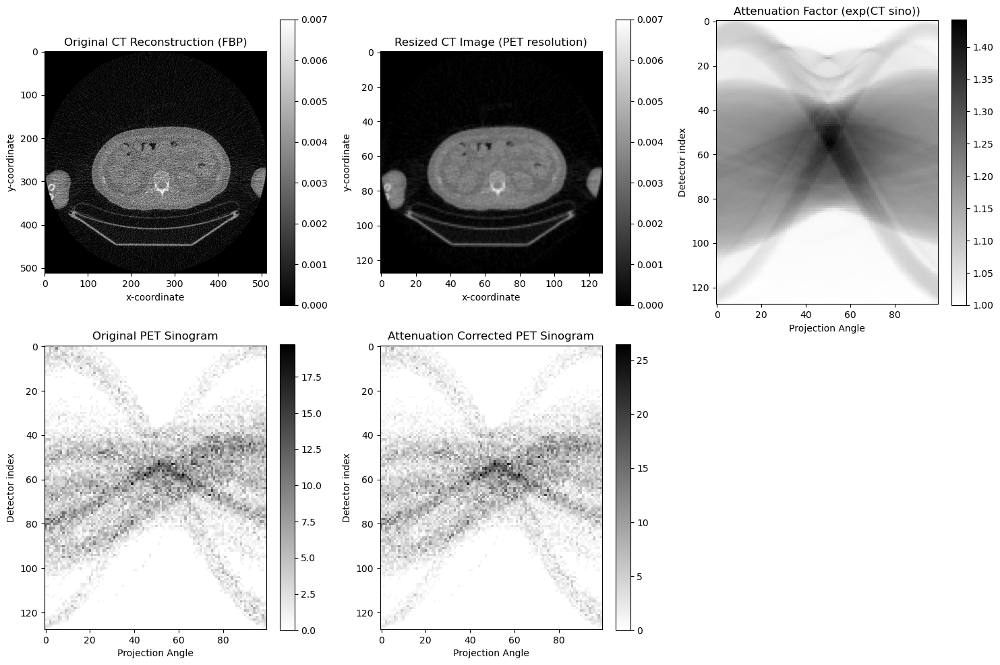

In [166]:
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage.transform import resize, radon
import time

# Define paths
data_path = "../data/Module1/"
reconstruction_data_path = "../data/Module1/processed/reconstruction/"
output_path = "../data/Module1/processed/reconstruction/"
os.makedirs(output_path, exist_ok=True)

# 1. Load data
# Load CT reconstruction image (using FBP reconstruction)
ct_image = np.load(os.path.join(reconstruction_data_path, "ct_reconstructed_fbp.npy"))
# Load PET sinogram with dimensions (128, 100)
pet_sino = np.load(os.path.join(data_path, "pet_sinogram.npy"))

# 2. Downsample CT image to PET resolution
# CT pixel: 1.06 mm, PET pixel: 4.24 mm
ct_image_resized = resize(ct_image, (128, 128),
                          mode='reflect',
                          anti_aliasing=True,
                          preserve_range=True)

# 3. Generate CT-derived attenuation sinogram
# PET sinogram acquisition: 100 angles between 0-180 degrees
pet_angles = np.linspace(0, 180, 100, endpoint=False)
ct_attenuation_sino = radon(ct_image_resized, theta=pet_angles, circle=True)

# 4. Calculate attenuation correction factors and apply to PET sinogram
# Correction factor A = exp(L), where L is CT-derived attenuation sinogram
attenuation_factor = np.exp(ct_attenuation_sino)
pet_sino_corrected = pet_sino * attenuation_factor

# 5. Visualization with layout
plt.figure(figsize=(15, 10))

# First row - 3 images
# Original CT reconstruction (FBP)
ax1 = plt.subplot(2, 3, 1)
im1 = ax1.imshow(ct_image, cmap='gray', vmin=0, vmax=0.007)
ax1.set_title("Original CT Reconstruction (FBP)")
ax1.set_xlabel("x-coordinate")
ax1.set_ylabel("y-coordinate")
plt.colorbar(im1, ax=ax1)

# Resized CT image (PET resolution)
ax2 = plt.subplot(2, 3, 2)
im2 = ax2.imshow(ct_image_resized, cmap='gray', vmin=0, vmax=0.007)
ax2.set_title("Resized CT Image (PET resolution)")
ax2.set_xlabel("x-coordinate")
ax2.set_ylabel("y-coordinate")
plt.colorbar(im2, ax=ax2)

# Attenuation factor (moved from second row to first row)
ax3 = plt.subplot(2, 3, 3)
im3 = ax3.imshow(attenuation_factor, cmap='gray_r')
ax3.set_title("Attenuation Factor (exp(CT sino))")
ax3.set_xlabel("Projection Angle")
ax3.set_ylabel("Detector index")
plt.colorbar(im3, ax=ax3)

# Second row - 2 images (centered)
# Original PET sinogram
ax4 = plt.subplot(2, 3, 4)
im4 = ax4.imshow(pet_sino, cmap='gray_r')
ax4.set_title("Original PET Sinogram")
ax4.set_xlabel("Projection Angle")
ax4.set_ylabel("Detector index")
plt.colorbar(im4, ax=ax4)

# Attenuation-corrected PET sinogram
ax5 = plt.subplot(2, 3, 5)
im5 = ax5.imshow(pet_sino_corrected, cmap='gray_r')
ax5.set_title("Attenuation Corrected PET Sinogram")
ax5.set_xlabel("Projection Angle")
ax5.set_ylabel("Detector index")
plt.colorbar(im5, ax=ax5)

plt.tight_layout()
plt.savefig(os.path.join(output_path, "attenuation_correction.png"), dpi=300)
plt.show()

# Save attenuation-corrected PET sinogram for later use
np.save(os.path.join(output_path, "pet_sino_attenuation_corrected.npy"), pet_sino_corrected)

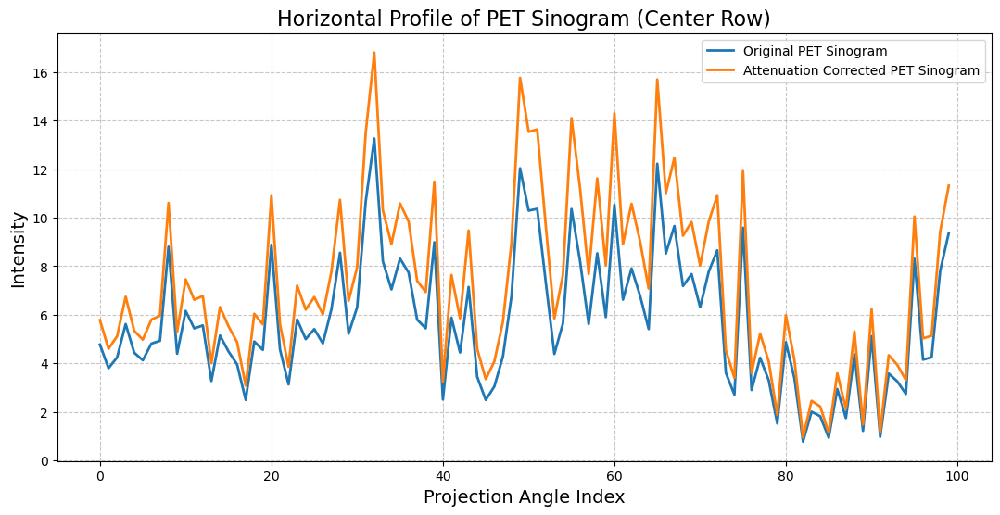

In [168]:
center_row = pet_sino.shape[0] // 2
plt.figure(figsize=(13, 6))
plt.plot(pet_sino[center_row, :], label="Original PET Sinogram", linewidth=2)
plt.plot(pet_sino_corrected[center_row, :], label="Attenuation Corrected PET Sinogram", linewidth=2)
plt.title("Horizontal Profile of PET Sinogram (Center Row)", fontsize=16)
plt.xlabel("Projection Angle Index", fontsize=14)
plt.ylabel("Intensity", fontsize=14)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig(os.path.join(output_path, "pet_sino_profile.png"), dpi=300)
plt.show()

### Ex1.4: PET Image Reconstruction with OSEM and MLEM


This exercise performs PET image reconstruction using three approaches: FBP, OSEM, and MLEM, followed by visual and quantitative comparisons.

---

**1. FBP Reconstruction (Baseline)**  
We first perform Filtered Back Projection (FBP) as a baseline reconstruction using the attenuation-corrected PET sinogram. FBP is efficient and commonly used for CT, but often inadequate for PET due to higher noise and limited photon counts.

---

**2. OSEM (Ordered Subset Expectation Maximization)**  
OSEM is applied to improve reconstruction quality with Poisson noise modeling. Key steps include:

- Divide projection angles into 5 subsets.  
- For each iteration, randomly permute and update subsets.  
- For each subset:
  - Forward project the current estimate.
  - Compute the ratio $\text{sino} / \text{proj}$.
  - Backproject this ratio and update multiplicatively.

---

**3. MLEM (Maximum Likelihood Expectation Maximization)**  
MLEM uses the full set of projections at each iteration (unlike OSEM subsets):

- Start from a uniform estimate.  
- At each iteration:
  - Forward project the estimate.  
  - Calculate ratio $\text{sino} / \text{proj}$  
  - Backproject and normalize:
    $$
    x^{(k+1)} = x^{(k)} \cdot \frac{A^T\left(\frac{y}{Ax^{(k)}}\right)}{A^T(1)}
    $$

---

**Summary:**  
- **OSEM** achieves better noise handling via subset-wise EM updates.  
- **MLEM** provides robust reconstruction with full projection use.  
- Both outperform FBP in structural fidelity and noise reduction.


2025-04-04 05:31:43,859 - INFO - Starting FBP reconstruction for PET...
2025-04-04 05:31:43,891 - INFO - Starting OSEM reconstruction for PET...
2025-04-04 05:31:43,904 - INFO - Running OSEM grid search with different gamma values...
2025-04-04 05:31:43,904 - INFO - OSEM with gamma=0.01
/Users/tinah/projects/dis_cw/term2/medical_imaging/env/lib/python3.10/site-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(
2025-04-04 05:31:44,170 - INFO -   Iteration 5: L2 diff = 5.002363, Forward error = 24.163216
2025-04-04 05:31:44,339 - INFO -   Iteration 10: L2 diff = 3.890830, Forward error = 18.864296
2025-04-04 05:31:44,668 - INFO -   Iteration 20: L2 diff = 2.353955, Forward error = 11.540071
2025-04-04 05:31:45,017 - INFO -   Iteration 30: L2 diff = 1.424015, Forward error = 7.114975
2025-04-04 05:31:45,768 - INFO -   Iteration 50: L2 diff = 0.521241, Forward error = 2.844768
2025-04-04 05:31:47,932 

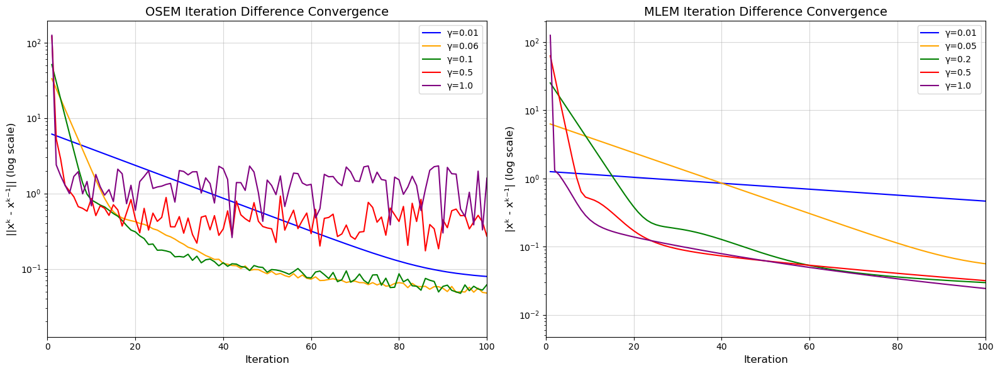

2025-04-04 05:32:49,094 - INFO - PET reconstruction with OSEM & MLEM completed! Results saved in ../data/Module1/processed/reconstruction
2025-04-04 05:32:49,094 - INFO - Further visualization will be done after examining the L2 convergence plots.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage.transform import radon, iradon
from tqdm import tqdm
import logging

# Setup paths and logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

data_path = "../data/Module1/processed/"
output_path = os.path.join(data_path, "reconstruction")
os.makedirs(output_path, exist_ok=True)

# 1. Load PET sinogram (assumed attenuation corrected), shape=(128,100)
pet_sino = np.load(os.path.join(data_path, "pet_sino_corrected.npy"))
pet_angles = np.linspace(0, 180, pet_sino.shape[1], endpoint=False)

# 2. FBP reconstruction for PET
logger.info("Starting FBP reconstruction for PET...")
pet_fbp = iradon(pet_sino, theta=pet_angles, filter_name='ramp', circle=True)

# 3. OSEM reconstruction
logger.info("Starting OSEM reconstruction for PET...")
# Recommended gamma values - providing a range from effective to less effective
# Gamma values that work well for both OSEM and MLEM
gamma_values = [0.01, 0.06, 0.1, 0.5, 1.0]  
iteration_values = [5, 10, 20, 30, 50, 100, 200]
num_subsets = 5
subset_size = pet_sino.shape[1] // num_subsets
subsets = [np.arange(i*subset_size, (i+1)*subset_size) for i in range(num_subsets)]

best_forward_error = float('inf')
best_gamma_osem, best_iterations_osem, best_osem = None, None, None
osem_results = {}

# Store convergence data
osem_l2_conv_curves = {g: [] for g in gamma_values}
osem_fwd_error_curves = {g: [] for g in gamma_values}

# Run OSEM for all parameter combinations
logger.info("Running OSEM grid search with different gamma values...")
for gamma in gamma_values:
    logger.info(f"OSEM with gamma={gamma}")
    recon = np.ones_like(pet_fbp)
    l2_conv_history = []
    fwd_error_history = []
    
    for it in range(max(iteration_values)):
        prev_recon = recon.copy()
        
        # Run one iteration of OSEM
        for sb in np.random.permutation(num_subsets):
            angles_sub = pet_angles[subsets[sb]]
            sino_sub = pet_sino[:, subsets[sb]]
            proj = radon(recon, theta=angles_sub, circle=True)
            ratio = np.divide(sino_sub, proj + 1e-8)
            backproj = iradon(ratio, theta=angles_sub, filter_name=None, circle=True)
            recon *= 1 + gamma * (backproj - 1)  # Modified update rule
        
        # Calculate L2 difference from previous iteration
        l2_diff = np.linalg.norm(recon - prev_recon)
        
        # Calculate forward projection error
        full_proj = radon(recon, theta=pet_angles, circle=True)
        fwd_error = np.linalg.norm(full_proj - pet_sino) / np.linalg.norm(pet_sino)
        
        # Store metrics
        l2_conv_history.append(l2_diff)
        fwd_error_history.append(fwd_error)
        
        # Save if this is one of our target iterations
        if (it + 1) in iteration_values:
            iter_val = it + 1
            osem_results[(gamma, iter_val)] = recon.copy()
            
            # Update best parameters if needed
            if fwd_error < best_forward_error:
                best_forward_error = fwd_error
                best_gamma_osem = gamma
                best_iterations_osem = iter_val
                best_osem = recon.copy()
                
            logger.info(f"  Iteration {iter_val}: L2 diff = {l2_diff:.6f}, Forward error = {fwd_error:.6f}")
    
    osem_l2_conv_curves[gamma] = l2_conv_history
    osem_fwd_error_curves[gamma] = fwd_error_history

logger.info(f"Best OSEM: gamma={best_gamma_osem}, iterations={best_iterations_osem}, forward error={best_forward_error:.6f}")

# 4. MLEM reconstruction for PET with different gamma values
# Using similar gamma values for comparison
mlem_gamma_values = [0.01, 0.05, 0.2, 0.5, 1.0]  # Using same values for direct comparison
logger.info("Starting MLEM reconstruction with different gamma values...")

ones_proj = np.ones_like(pet_sino)
norm_factor = iradon(ones_proj, theta=pet_angles, filter_name=None, circle=True)
max_iter_mlem = max(iteration_values)
mlem_results = {}
best_forward_error_mlem = float('inf')
best_gamma_mlem, best_iterations_mlem, best_mlem = None, None, None

# Store MLEM convergence data
mlem_l2_conv_curves = {g: [] for g in mlem_gamma_values}
mlem_fwd_error_curves = {g: [] for g in mlem_gamma_values}

for gamma in mlem_gamma_values:
    logger.info(f"MLEM with gamma={gamma}")
    mlem_recon = np.ones_like(pet_fbp)
    l2_conv_history = []
    fwd_error_history = []
    
    for it in range(max_iter_mlem):
        prev_mlem = mlem_recon.copy()
        
        # Modified MLEM update with gamma as relaxation parameter
        Ax = radon(mlem_recon, theta=pet_angles, circle=True)
        ratio = np.divide(pet_sino, Ax + 1e-8)
        bp = iradon(ratio, theta=pet_angles, filter_name=None, circle=True)
        update = gamma * (bp / (norm_factor + 1e-8) - 1) + 1
        mlem_recon *= update
        
        # Calculate L2 difference
        l2_diff = np.linalg.norm(mlem_recon - prev_mlem)
        
        # Calculate forward projection error
        fwd_error = np.linalg.norm(Ax - pet_sino) / np.linalg.norm(pet_sino)
        
        # Store metrics
        l2_conv_history.append(l2_diff)
        fwd_error_history.append(fwd_error)
        
        # Save if this is one of our target iterations
        if (it + 1) in iteration_values:
            iter_val = it + 1
            mlem_results[(gamma, iter_val)] = mlem_recon.copy()
            
            # Update best parameters if needed
            if fwd_error < best_forward_error_mlem:
                best_forward_error_mlem = fwd_error
                best_gamma_mlem = gamma
                best_iterations_mlem = iter_val
                best_mlem = mlem_recon.copy()
                
            logger.info(f"  Iteration {iter_val}: L2 diff = {l2_diff:.6f}, Forward error = {fwd_error:.6f}")
    
    mlem_l2_conv_curves[gamma] = l2_conv_history
    mlem_fwd_error_curves[gamma] = fwd_error_history

logger.info(f"Best MLEM: gamma={best_gamma_mlem}, iterations={best_iterations_mlem}, forward error={best_forward_error_mlem:.6f}")

# 5. Convergence plots - Iteration Difference convergence with log scale

plt.style.use('default')  # Reset to default style (white background)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left plot: L2 Convergence for OSEM with different gamma values
for i, gamma in enumerate(gamma_values):
    if gamma in osem_l2_conv_curves and len(osem_l2_conv_curves[gamma]) > 0:
        l2_data = osem_l2_conv_curves[gamma]
        iterations = range(1, len(l2_data) + 1)
        axes[0].semilogy(iterations, l2_data, color=colors[i % len(colors)], linewidth=1.5, label=f"γ={gamma}")

axes[0].set_title("OSEM Iteration Difference Convergence", fontsize=14)
axes[0].set_xlabel("Iteration", fontsize=12)
axes[0].set_ylabel("||xᵏ - xᵏ⁻¹|| (log scale)", fontsize=12)
axes[0].legend(loc='upper right')
axes[0].grid(True, alpha=0.5)
axes[0].set_xlim(0, 100)  # Set x-axis limit to 100 iterations

# Right plot: L2 Convergence for MLEM with different gamma values
for i, gamma in enumerate(mlem_gamma_values):
    if gamma in mlem_l2_conv_curves and len(mlem_l2_conv_curves[gamma]) > 0:
        l2_data = mlem_l2_conv_curves[gamma]
        iterations = range(1, len(l2_data) + 1)
        axes[1].semilogy(iterations, l2_data, color=colors[i % len(colors)], linewidth=1.5, label=f"γ={gamma}")

axes[1].set_title("MLEM Iteration Difference Convergence", fontsize=14)
axes[1].set_xlabel("Iteration", fontsize=12)
axes[1].set_ylabel("|xᵏ - xᵏ⁻¹| (log scale)", fontsize=12)
axes[1].legend(loc='upper right')
axes[1].grid(True, alpha=0.5)
axes[1].set_xlim(0, 100)  # Set x-axis limit to 100 iterations

plt.tight_layout()
plt.savefig(os.path.join(output_path, "pet_l2_convergence_plots.png"), dpi=300)
plt.show()


# Save final results and parameters
np.save(os.path.join(output_path, "pet_reconstructed_fbp.npy"), pet_fbp)
np.save(os.path.join(output_path, "pet_reconstructed_osem.npy"), best_osem)
np.save(os.path.join(output_path, "pet_reconstructed_mlem.npy"), best_mlem)

# Save convergence data for later use
np.save(os.path.join(output_path, "osem_l2_convergence_data.npy"), osem_l2_conv_curves)
np.save(os.path.join(output_path, "osem_fwd_error_data.npy"), osem_fwd_error_curves)
np.save(os.path.join(output_path, "mlem_l2_convergence_data.npy"), mlem_l2_conv_curves)
np.save(os.path.join(output_path, "mlem_fwd_error_data.npy"), mlem_fwd_error_curves)

with open(os.path.join(output_path, "pet_osem_mlem_parameters.txt"), "w") as f:
    f.write("OSEM parameters:\n")
    f.write(f"  Tested gamma values: {gamma_values}\n")
    f.write(f"  Optimal gamma: {best_gamma_osem}\n")
    f.write(f"  Optimal iterations: {best_iterations_osem}\n")
    f.write(f"  Forward projection error: {best_forward_error:.6f}\n\n")
    f.write("MLEM parameters:\n")
    f.write(f"  Tested gamma values: {mlem_gamma_values}\n")
    f.write(f"  Optimal gamma: {best_gamma_mlem}\n")
    f.write(f"  Optimal iterations: {best_iterations_mlem}\n")
    f.write(f"  Forward projection error: {best_forward_error_mlem:.6f}\n")

logger.info("PET reconstruction with OSEM & MLEM completed! Results saved in " + output_path)
logger.info("Further visualization will be done after examining the L2 convergence plots.")

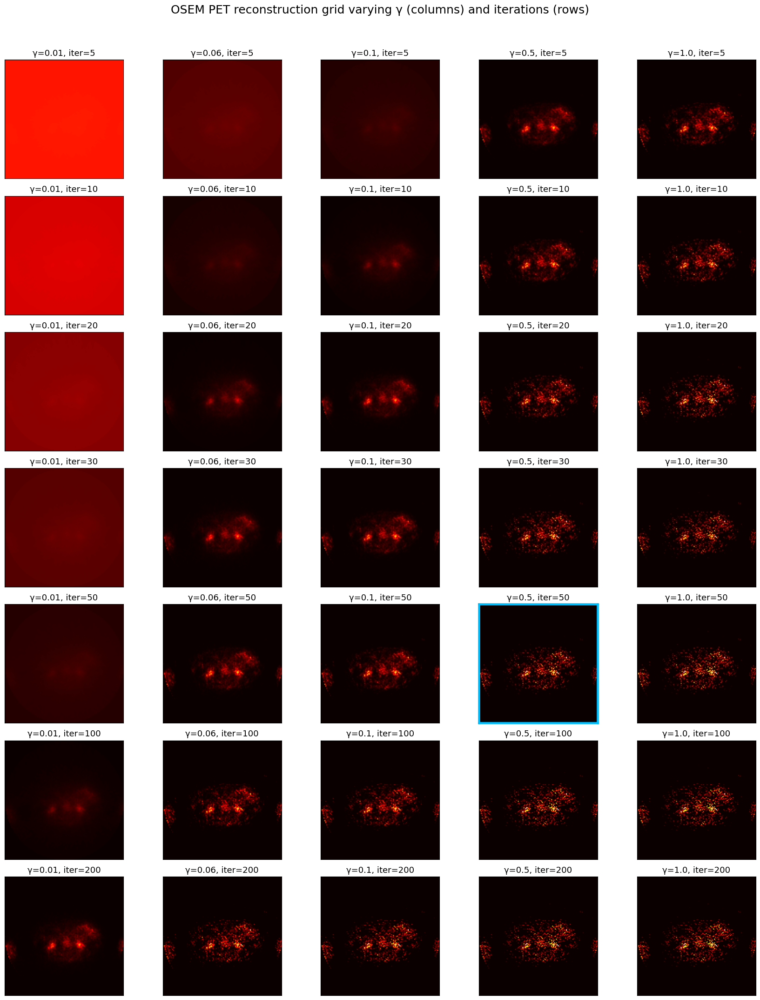

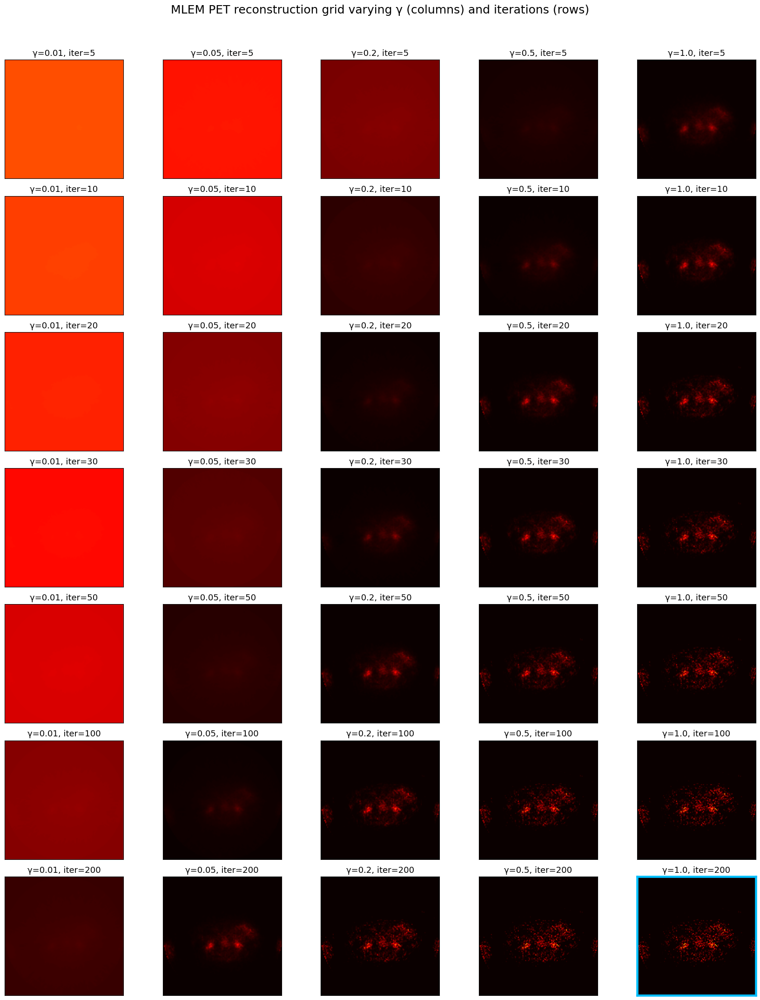

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

# -------------------------- Grid Search Series Visualization --------------------------
# ---------------------- Set the Best Parameters to Highlight ----------------------
best_gamma_osem = 0.5
best_iterations_osem = 50

best_gamma_mlem = 1.0
best_iterations_mlem = 200

# ---------------------- (A) OSEM PET Grid Search Visualization ----------------------
osem_selected_gammas = gamma_values  # Should be a list of gammas used in OSEM
rows = len(iteration_values)
cols = len(osem_selected_gammas)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 3))
fig.suptitle("OSEM PET reconstruction grid varying γ (columns) and iterations (rows)", fontsize=18, y=1.02)

# Turn off default grid on all subplots
for ax in axes.flatten():
    ax.grid(False)

for col_idx, gamma in enumerate(osem_selected_gammas):
    for row_idx, iter_val in enumerate(iteration_values):
        ax = axes[row_idx, col_idx]

        # Check if this reconstruction exists
        if (gamma, iter_val) in osem_results:
            rec = osem_results[(gamma, iter_val)]
            im = ax.imshow(rec, cmap="hot")
            ax.set_title(f"γ={gamma}, iter={iter_val}", fontsize=13)

            # Set color scaling based on global vmax
            vmax = max(pet_fbp.max(), best_osem.max(), best_mlem.max())
            im.set_clim(0, vmax)

            # Highlight the best configuration
            if gamma == best_gamma_osem and iter_val == best_iterations_osem:
                for spine in ax.spines.values():
                    spine.set_edgecolor('deepskyblue')
                    spine.set_linewidth(3.3)
        else:
            # Fill in missing data slot
            ax.set_facecolor('lightgray')
            ax.text(0.5, 0.5, "Missing", ha='center', va='center')
            ax.set_title(f"γ={gamma}, iter={iter_val}", fontsize=13)

        # Hide axis ticks
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout(rect=[0, 0, 1, 1])
plt.savefig(os.path.join(output_path, "osem_pet_series_by_gamma.png"), dpi=300)
plt.show()

# ---------------------- (B) MLEM PET Grid Search Visualization ----------------------
mlem_selected_gammas = mlem_gamma_values  # Should be a list of gammas used in MLEM
rows = len(iteration_values)
cols = len(mlem_selected_gammas)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 3))
fig.suptitle("MLEM PET reconstruction grid varying γ (columns) and iterations (rows)", fontsize=18, y=1.02)

for ax in axes.flatten():
    ax.grid(False)

for col_idx, gamma in enumerate(mlem_selected_gammas):
    for row_idx, iter_val in enumerate(iteration_values):
        ax = axes[row_idx, col_idx]

        if (gamma, iter_val) in mlem_results:
            rec = mlem_results[(gamma, iter_val)]
            im = ax.imshow(rec, cmap="hot")
            ax.set_title(f"γ={gamma}, iter={iter_val}", fontsize=13)

            vmax = max(pet_fbp.max(), best_osem.max(), best_mlem.max())
            im.set_clim(0, vmax)

            if gamma == best_gamma_mlem and iter_val == best_iterations_mlem:
                for spine in ax.spines.values():
                    spine.set_edgecolor('deepskyblue')
                    spine.set_linewidth(3.3)
        else:
            ax.set_facecolor('lightgray')
            ax.text(0.5, 0.5, "Missing", ha='center', va='center')
            ax.set_title(f"γ={gamma}, iter={iter_val}", fontsize=13)

        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout(rect=[0, 0, 1, 1])
# plt.savefig(os.path.join(output_path, "mlem_pet_series_by_gamma.png"), dpi=300)
plt.show()


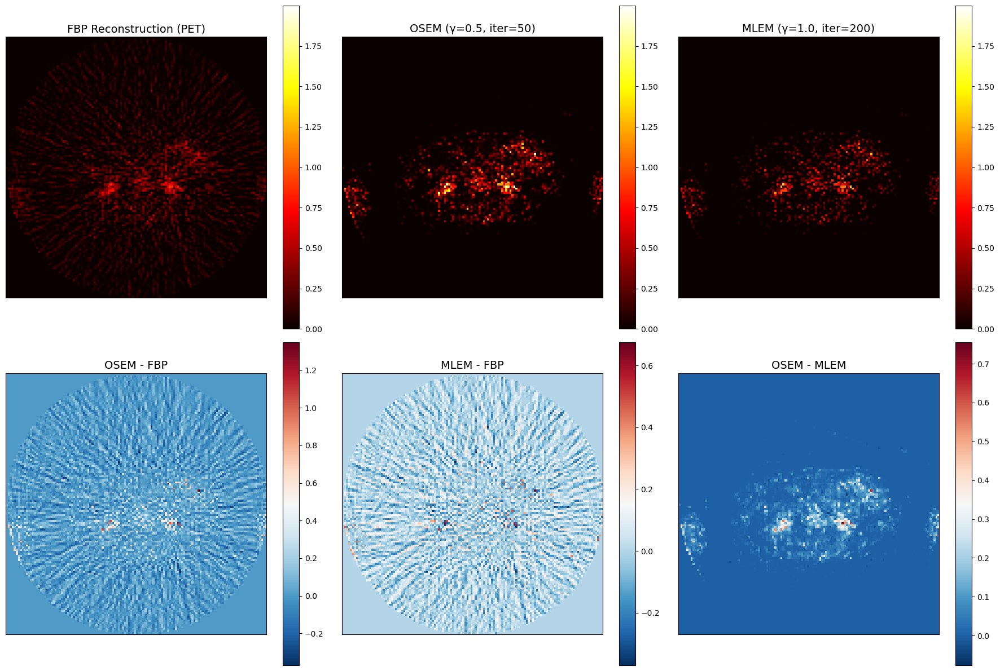

In [200]:
# Final comparison visualization of FBP, OSEM, and MLEM reconstructions
import matplotlib.pyplot as plt
import numpy as np

# Create figure with 2x3 subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Top row: Show reconstructions
# FBP Reconstruction
im1 = axes[0, 0].imshow(pet_fbp, cmap='hot')
axes[0, 0].set_title("FBP Reconstruction (PET)", fontsize=14)
cbar1 = plt.colorbar(im1, ax=axes[0, 0])

# OSEM with selected parameters
osem_result = osem_results.get((0.5, 30), best_osem)  # Use best_osem as fallback
im2 = axes[0, 1].imshow(osem_result, cmap='hot')
axes[0, 1].set_title(f"OSEM (γ=0.5, iter=50)", fontsize=14)
cbar2 = plt.colorbar(im2, ax=axes[0, 1])

# MLEM with selected parameters
mlem_result = mlem_results.get((1.0, 200), best_mlem)  # Use best_mlem as fallback
im3 = axes[0, 2].imshow(mlem_result, cmap='hot')
axes[0, 2].set_title(f"MLEM (γ=1.0, iter=200)", fontsize=14)
cbar3 = plt.colorbar(im3, ax=axes[0, 2])

# Bottom row: Show differences
# OSEM - FBP
diff1 = osem_result - pet_fbp
im4 = axes[1, 0].imshow(diff1, cmap='RdBu_r')
axes[1, 0].set_title("OSEM - FBP", fontsize=14)
cbar4 = plt.colorbar(im4, ax=axes[1, 0])

# MLEM - FBP
diff2 = mlem_result - pet_fbp
im5 = axes[1, 1].imshow(diff2, cmap='RdBu_r')
axes[1, 1].set_title("MLEM - FBP", fontsize=14)
cbar5 = plt.colorbar(im5, ax=axes[1, 1])

# OSEM - MLEM
diff3 = osem_result - mlem_result
im6 = axes[1, 2].imshow(diff3, cmap='RdBu_r')
axes[1, 2].set_title("OSEM - MLEM", fontsize=14)
cbar6 = plt.colorbar(im6, ax=axes[1, 2])

# Set consistent color scaling for reconstructions
vmax = max(pet_fbp.max(), osem_result.max(), mlem_result.max())
im1.set_clim(0, vmax)
im2.set_clim(0, vmax)
im3.set_clim(0, vmax)

# Common adjustments
for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig(os.path.join(output_path, "pet_final_comparison.png"), dpi=300)
plt.show()

### Ex1.5: Theory and Discussion

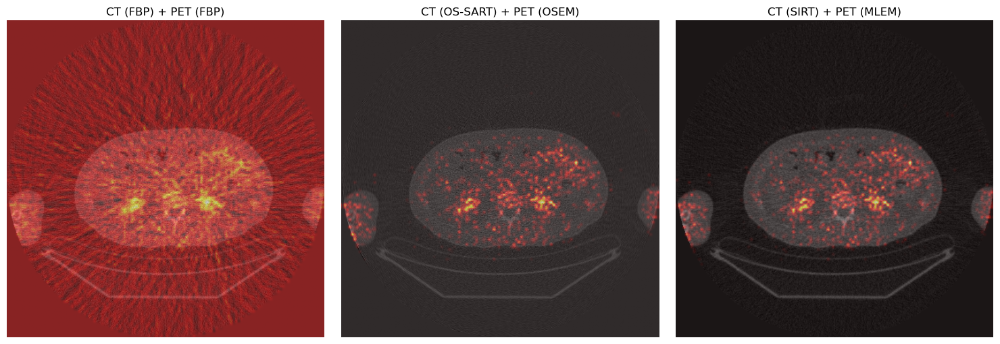

In [242]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize

# --- Load all reconstructions ---
ct_image = np.load("../data/Module1/processed/reconstruction/fbp_reconstruction.npy")
pet_image = np.load("../data/Module1/processed/reconstruction/pet_reconstructed_fbp.npy")

ct_image_sart = np.load("../data/Module1/processed/reconstruction/best_os_sart_reconstruction.npy")
pet_image_osem = np.load("../data/Module1/processed/reconstruction/pet_reconstructed_osem.npy")

ct_image_sirt = np.load("../data/Module1/processed/reconstruction/best_sirt_reconstruction.npy")
pet_image_mlem = np.load("../data/Module1/processed/reconstruction/pet_reconstructed_mlem.npy")

# --- Resize PET images to match CT image shapes ---
if ct_image.shape != pet_image.shape:
    pet_image_resized = resize(pet_image, ct_image.shape, preserve_range=True)
else:
    pet_image_resized = pet_image

if ct_image_sart.shape != pet_image_osem.shape:
    pet_image_osem_resized = resize(pet_image_osem, ct_image_sart.shape, preserve_range=True)
else:
    pet_image_osem_resized = pet_image_osem

if ct_image_sirt.shape != pet_image_mlem.shape:
    pet_image_mlem_resized = resize(pet_image_mlem, ct_image_sirt.shape, preserve_range=True)
else:
    pet_image_mlem_resized = pet_image_mlem

# --- Plot all overlays in a single row ---
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# (1) CT (FBP) + PET (FBP)
axes[0].imshow(ct_image, cmap='gray')
axes[0].imshow(pet_image_resized, cmap='hot', alpha=0.5)
axes[0].set_title("CT (FBP) + PET (FBP)")
axes[0].axis("off")

# (2) CT (OS-SART) + PET (OSEM)
axes[1].imshow(ct_image_sart, cmap='gray')
axes[1].imshow(pet_image_osem_resized, cmap='hot', alpha=0.5)
axes[1].set_title("CT (OS-SART) + PET (OSEM)")
axes[1].axis("off")

# (3) CT (SIRT) + PET (MLEM)
axes[2].imshow(ct_image_sirt, cmap='gray')
axes[2].imshow(pet_image_mlem_resized, cmap='hot', alpha=0.5)
axes[2].set_title("CT (SIRT) + PET (MLEM)")
axes[2].axis("off")

plt.tight_layout()
plt.savefig("../data/Module1/processed/reconstruction/overlay_CT_PET_all.png", dpi=300)
plt.show()


**1.5.2 TOF-PET Timing Resolution**

Time-of-Flight (TOF) PET aims to use the precise measurement of photon arrival times to localize the annihilation event. To localize within approximately 1 cm without needing a full reconstruction, the required time resolution must be on the order of tens of picoseconds:

- Light travels roughly 30 cm in 1 ns.  
- For a 1 cm localization accuracy, the timing resolution needs to be around  
  $$
  1\,\text{cm} / (30\,\text{cm/ns}) \approx 33\,\text{ps}.
  $$
- Practically, many TOF-PET systems aim for < 60–70 ps to achieve significant localization benefits.

Such extremely fine time resolution ensures that the detector can discriminate where along the line of response the annihilation occurred, reducing the need for extensive iterative reconstruction in principle.

---

**1.5.3 Why OSEM for PET (But Not CT)?**

**OSEM (Ordered Subset Expectation Maximization)** is particularly well suited for PET because:

1. **Poisson noise model**: PET data inherently follows a Poisson distribution, and OSEM (an EM-based approach) directly matches this statistical nature, providing more accurate reconstructions.
2. **Subset updates**: OSEM divides projections into subsets, accelerating convergence and managing noise more effectively in emission data.

By contrast, **CT projection data** generally behaves closer to a Gaussian noise model. **FBP** (Filtered Back Projection) or **SART/SIRT** (iterative linear reconstructions) are sufficient and computationally efficient. OSEM’s multiplicative update step reflects the maximum-likelihood approach for Poisson statistics, whereas gradient descent typically uses **additive** updates on a cost function. Their mathematical frameworks differ significantly, making OSEM more natural for PET emission data than for CT.

---

**1.5.4 Extra Processing in PET-MR**

Unlike PET-CT, **PET-MR** does not provide direct X-ray-based attenuation coefficients. Hence, additional steps are required to derive an attenuation map:

- **MR-based tissue segmentation**: Classify tissues (e.g., soft tissue, bone, air) to approximate the attenuation properties.
- **Synthetic CT or atlas-based approaches**: Generate “pseudo-CT” from MR sequences (e.g., Dixon, ZTE) to estimate attenuation values.

This extra step—**MR-based attenuation correction (MRAC)**—compensates for the lack of direct CT attenuation information, ensuring PET quantification remains accurate.

---

**Summary**
- **TOF-PET** needs extremely high timing resolution to pinpoint events more precisely.  
- **OSEM** is favored in PET due to Poisson noise modeling and multiplicative updates, whereas CT is typically reconstructed with linear methods like FBP or SART/SIRT.  
- **PET-MR** requires specialized MR-based attenuation correction because MR alone does not provide direct attenuation coefficients, unlike CT.